In [11]:
import matplotlib.pyplot as plt
from scipy import stats
import pickle
import os, sys
sys.path.append(os.path.join(os.getcwd(), '..')) # this is the ml_dadi dir
import data_manip, ml_models, plotting
from plotting import plot_by_param_4x4, plot_by_param_2x2

In [17]:
# Load test data set and trained models
list_test_dict = pickle.load(open('data/test_data','rb'))
list_rfr = pickle.load(open('data/list_rfr','rb'))
list_mlpr = pickle.load(open('data/list_mlpr','rb'))

In [2]:
# # old data files
# list_test_dict = pickle.load(open('../../data/2d-splitmig/test-data-corrected','rb'))
# list_rfr = pickle.load(open('../../data/2d-splitmig/list-rfr','rb'))

Trying to unpickle estimator DecisionTreeRegressor from version 0.23.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.Trying to unpickle estimator RandomForestRegressor from version 0.23.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

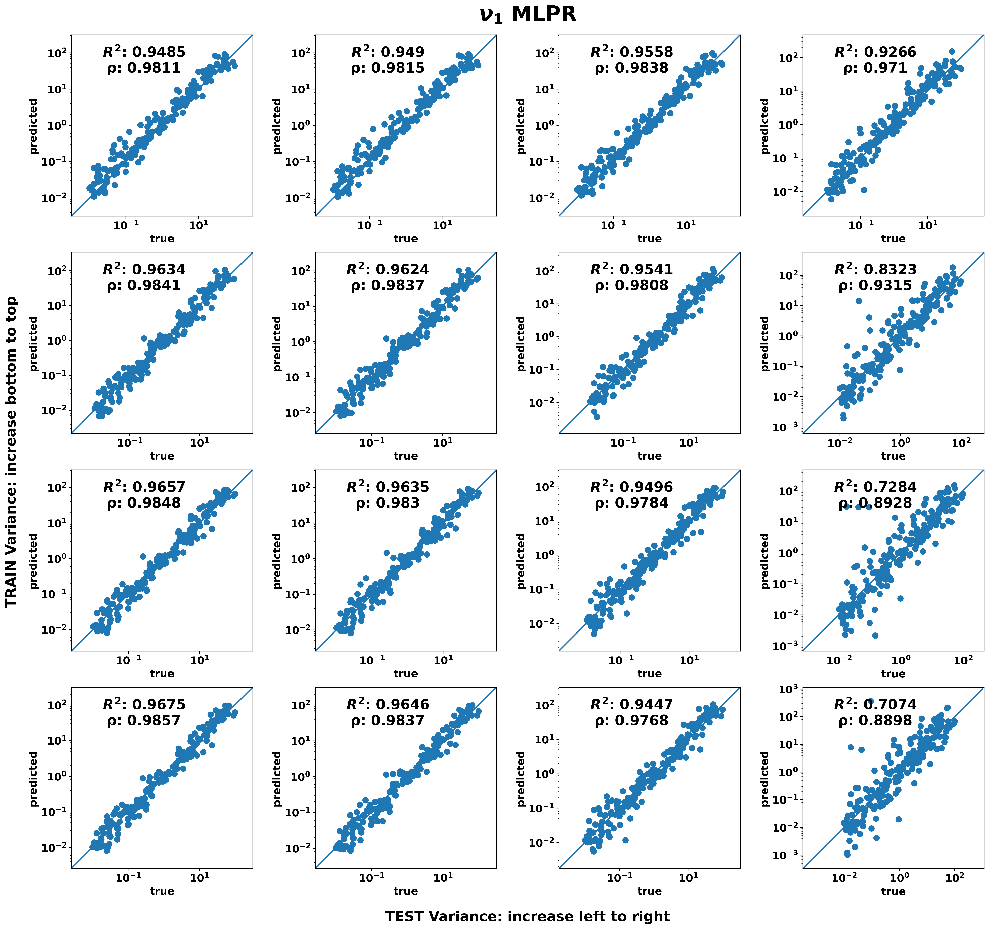

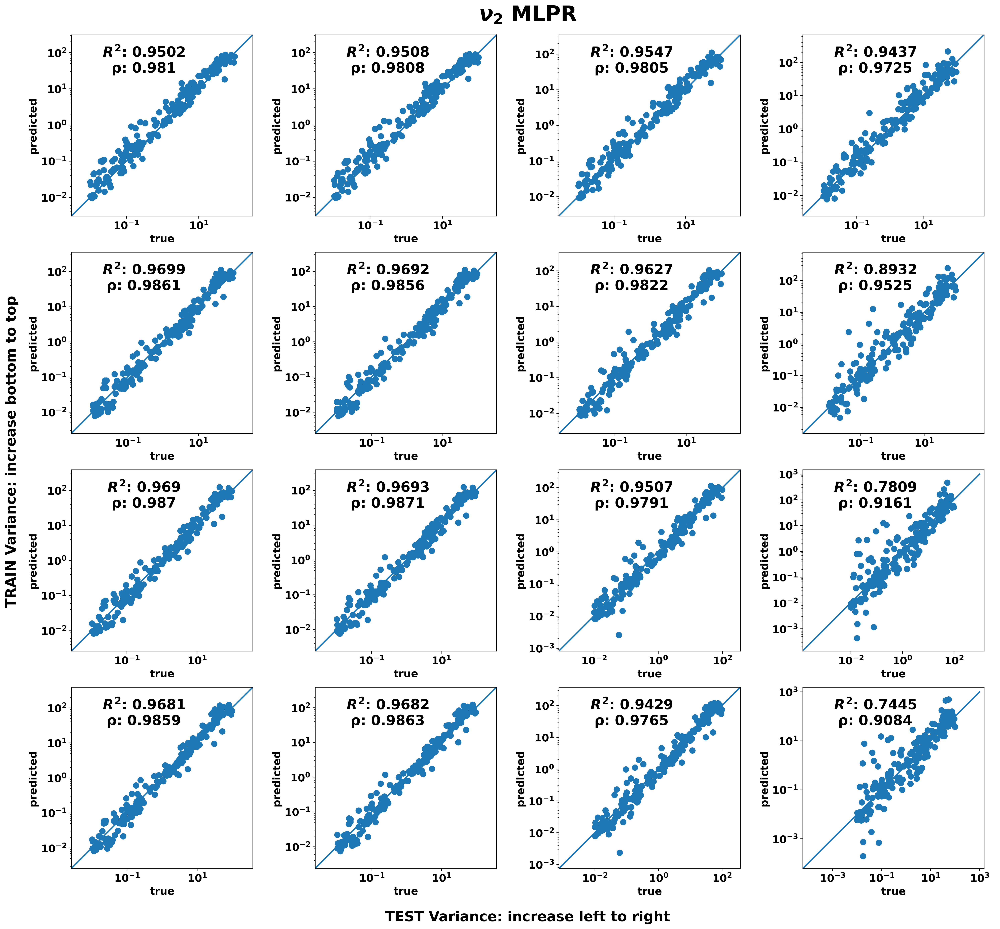

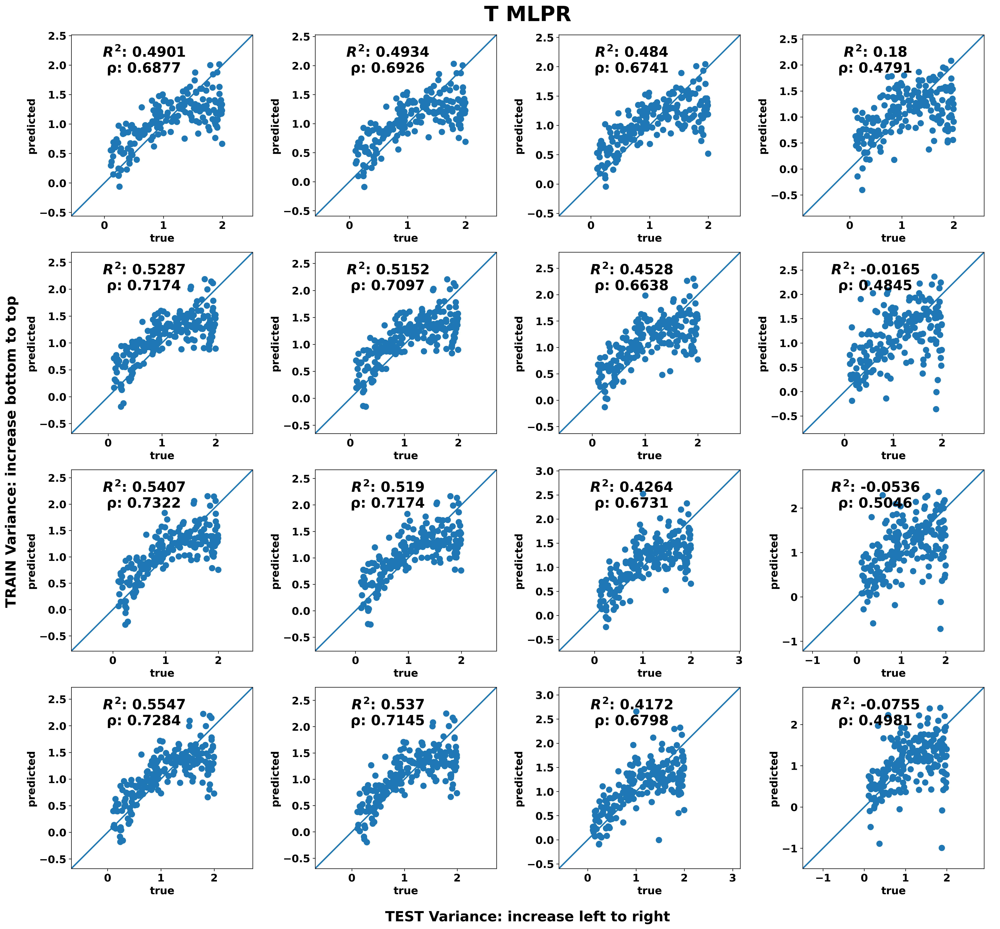

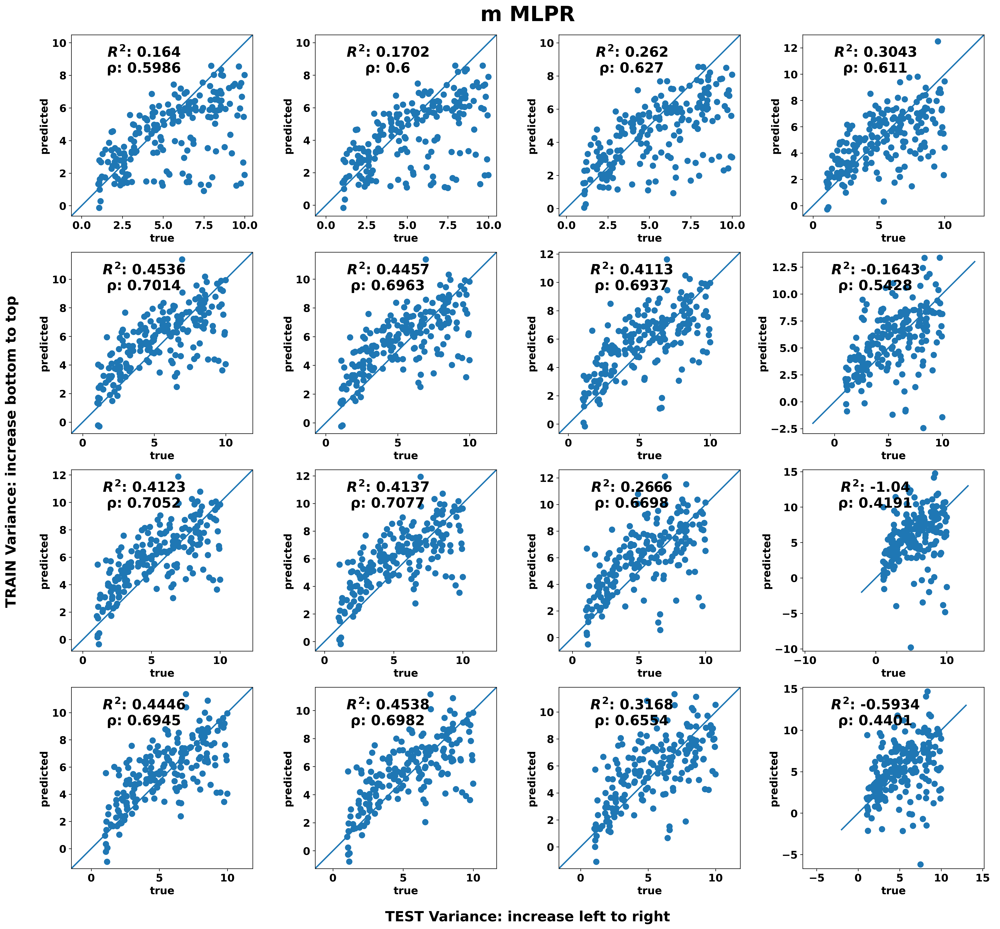

In [18]:
# Plot 4x4 training & testing var, no color
# Create 4 figures, one for each param
fig1=plt.figure(1, figsize=(24,22), dpi=300)
# plt.gca().set_title(r'$ν_1$ RFR', fontsize=30 , fontweight='bold', pad=20)
plt.gca().set_title(r'$ν_1$ MLPR', fontsize=30 , fontweight='bold', pad=20)

fig2=plt.figure(2, figsize=(24,22), dpi=300)
# plt.gca().set_title(r'$ν_2$ RFR', fontsize=30 , fontweight='bold', pad=20)
plt.gca().set_title(r'$ν_2$ MLPR', fontsize=30 , fontweight='bold', pad=20)

fig3=plt.figure(3, figsize=(24,22), dpi=300)
# plt.gca().set_title("T RFR", fontsize=30 , fontweight='bold', pad=20)
plt.gca().set_title("T MLPR", fontsize=30 , fontweight='bold', pad=20)

fig4=plt.figure(4, figsize=(24,22), dpi=300)
# plt.gca().set_title("m RFR", fontsize=30 , fontweight='bold', pad=20)
plt.gca().set_title("m MLPR", fontsize=30 , fontweight='bold', pad=20)

for i in [1,2,3,4]:
    plt.figure(i)
    ax = plt.gca()
    ax.set_xlabel("TEST Variance: increase left to right", 
                    fontsize=20 , fontweight='bold', labelpad=60)
    ax.set_ylabel("TRAIN Variance: increase bottom to top", 
                    fontsize=20 , fontweight='bold', labelpad=60)
    for key, spine in ax.spines.items():
        spine.set_visible(False)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.xticks([])
    plt.yticks([])
    plt.rcParams.update({'font.size': 15})
    plt.rcParams.update({'font.weight': 'bold'})

# testing, and plotting
count_pos = 1
# for rfr in reversed(list_rfr):# flip the order of trained rfr for plotting
for mlpr in reversed(list_mlpr):
    for test_dict in list_test_dict:
        # Choose mlpr or rfr to plot
        # y_true, y_pred = ml_models.rfr_test(rfr, test_dict)
        y_true, y_pred = ml_models.mlpr_test(mlpr, test_dict)
        
        # sort test results by param for plotting
        param_true, param_pred = data_manip.sort_by_param(y_true, y_pred)
        # calculate r2 and rho scores by param
        r2_by_param = ml_models.r2(y_true, y_pred)[1]
        rho_by_param = stats.spearmanr(y_true, y_pred)
        
        # PLOT MULTIPLE SUBPLOT
        plt.figure(1)
        fig1.add_subplot(4, 4, count_pos)
        log_nu1_true = [10**p_true for p_true in param_true[0]]
        log_nu1_pred =  [10**p_pred for p_pred in param_pred[0]]
        plot_by_param_4x4(log_nu1_true, log_nu1_pred, r2_by_param[0],
                                rho=rho_by_param[0][0][4])

        plt.figure(2)
        fig2.add_subplot(4, 4, count_pos)
        log_nu2_true = [10**p_true for p_true in param_true[1]]
        log_nu2_pred =  [10**p_pred for p_pred in param_pred[1]]
        plot_by_param_4x4(log_nu2_true, log_nu2_pred, r2_by_param[1], 
                                rho=rho_by_param[0][1][5])

        plt.figure(3)
        fig3.add_subplot(4, 4, count_pos)
        plot_by_param_4x4(param_true[2], param_pred[2], r2_by_param[2],
                                rho=rho_by_param[0][2][6])

        plt.figure(4)
        fig4.add_subplot(4, 4, count_pos)
        plot_by_param_4x4(param_true[3], param_pred[3], r2_by_param[3],
                                rho=rho_by_param[0][3][7])
        count_pos += 1

fig1.show()
fig2.show()
fig3.show()
fig4.show()

In [5]:
# fig1.savefig('results/RFR/nu1_old.png', bbox_inches='tight')
# fig2.savefig('results/RFR/nu2_old.png', bbox_inches='tight')
# fig3.savefig('results/RFR/T_old.png', bbox_inches='tight')
# fig4.savefig('results/RFR/m_old.png', bbox_inches='tight')

In [14]:
# fig1.savefig('results/RFR/nu1.png', bbox_inches='tight')
# fig2.savefig('results/RFR/nu2.png', bbox_inches='tight')
# fig3.savefig('results/RFR/T.png', bbox_inches='tight')
# fig4.savefig('results/RFR/m.png', bbox_inches='tight')

In [19]:
fig1.savefig('results/MLPR/nu1.png', bbox_inches='tight')
fig2.savefig('results/MLPR/nu2.png', bbox_inches='tight')
fig3.savefig('results/MLPR/T.png', bbox_inches='tight')
fig4.savefig('results/MLPR/m.png', bbox_inches='tight')

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

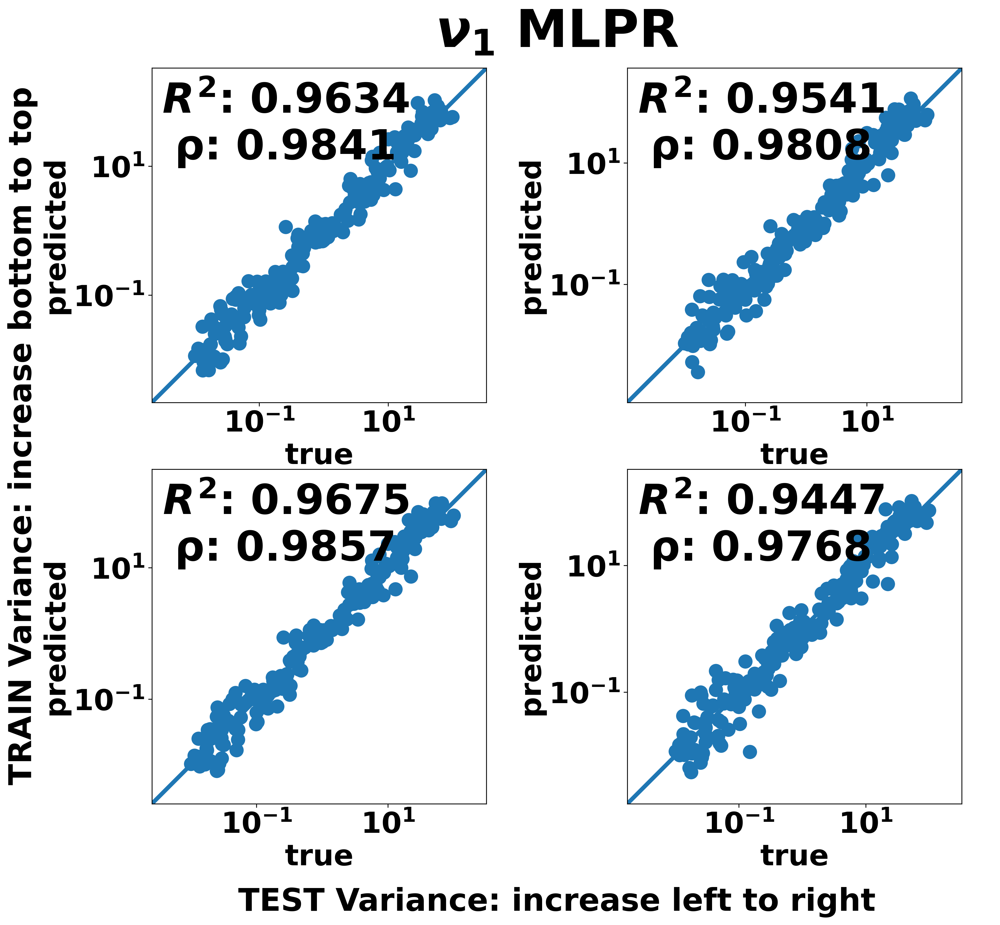

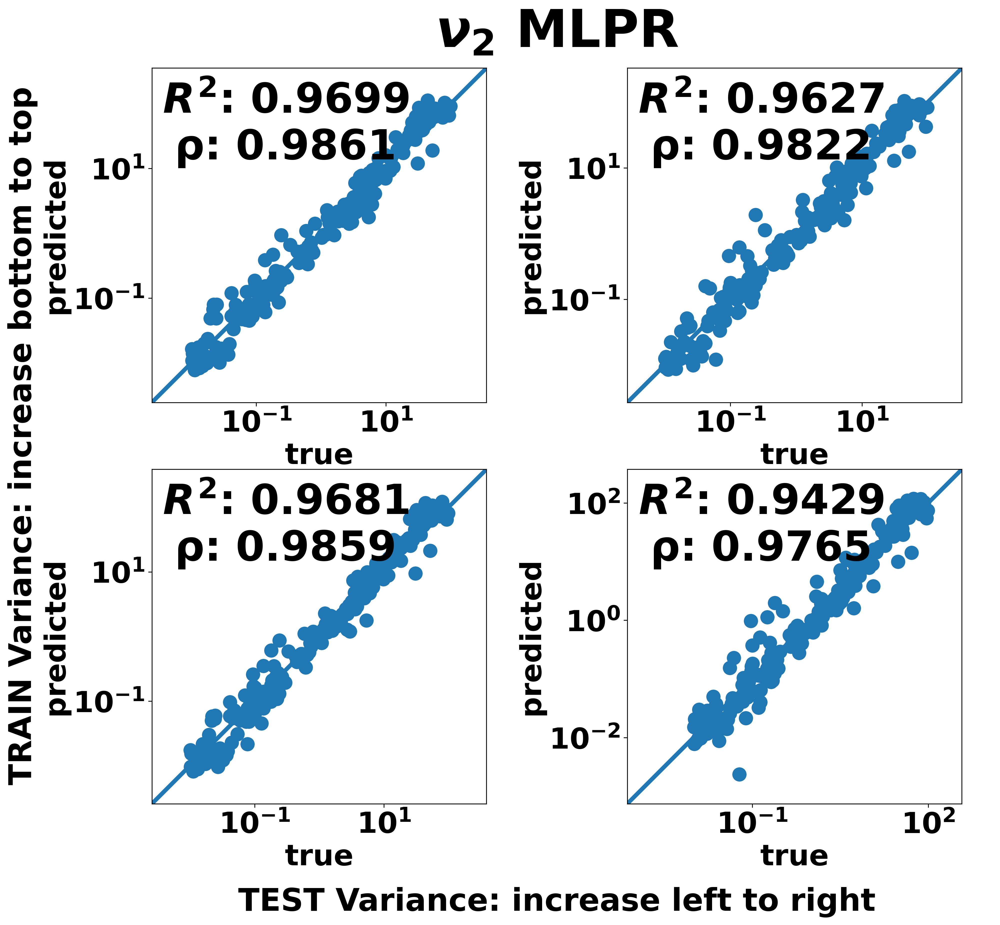

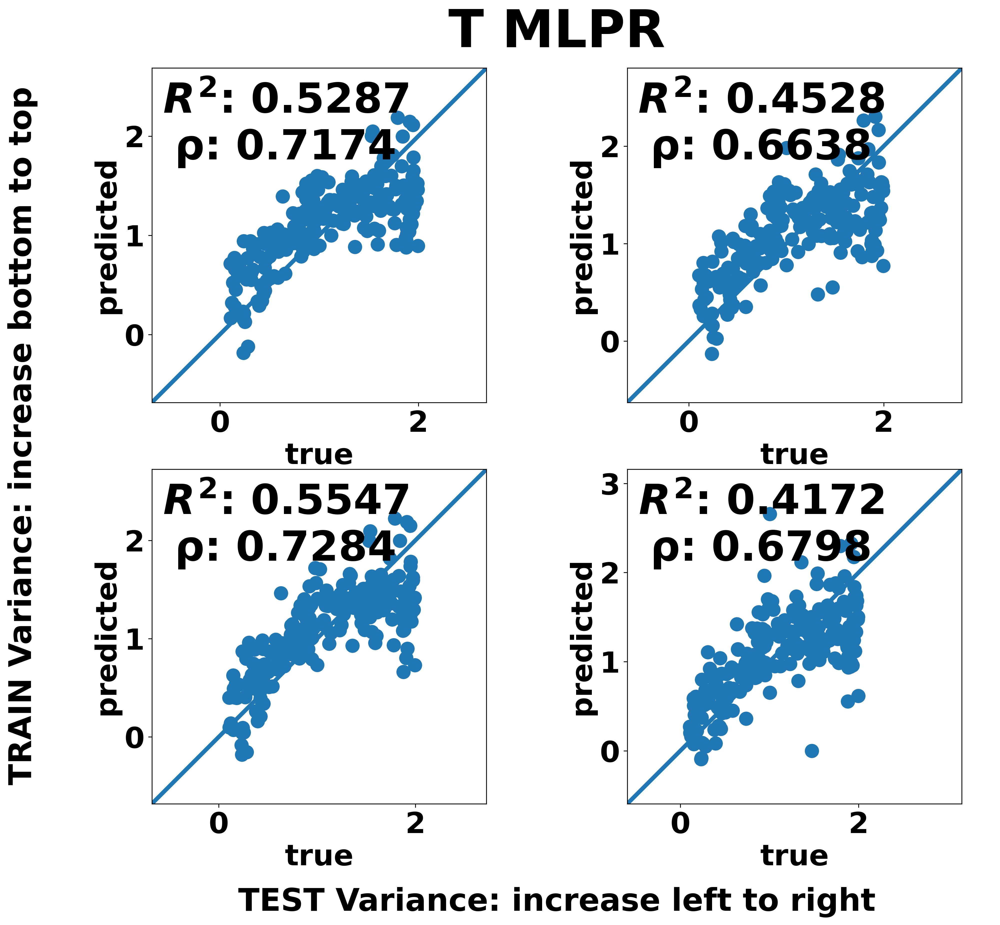

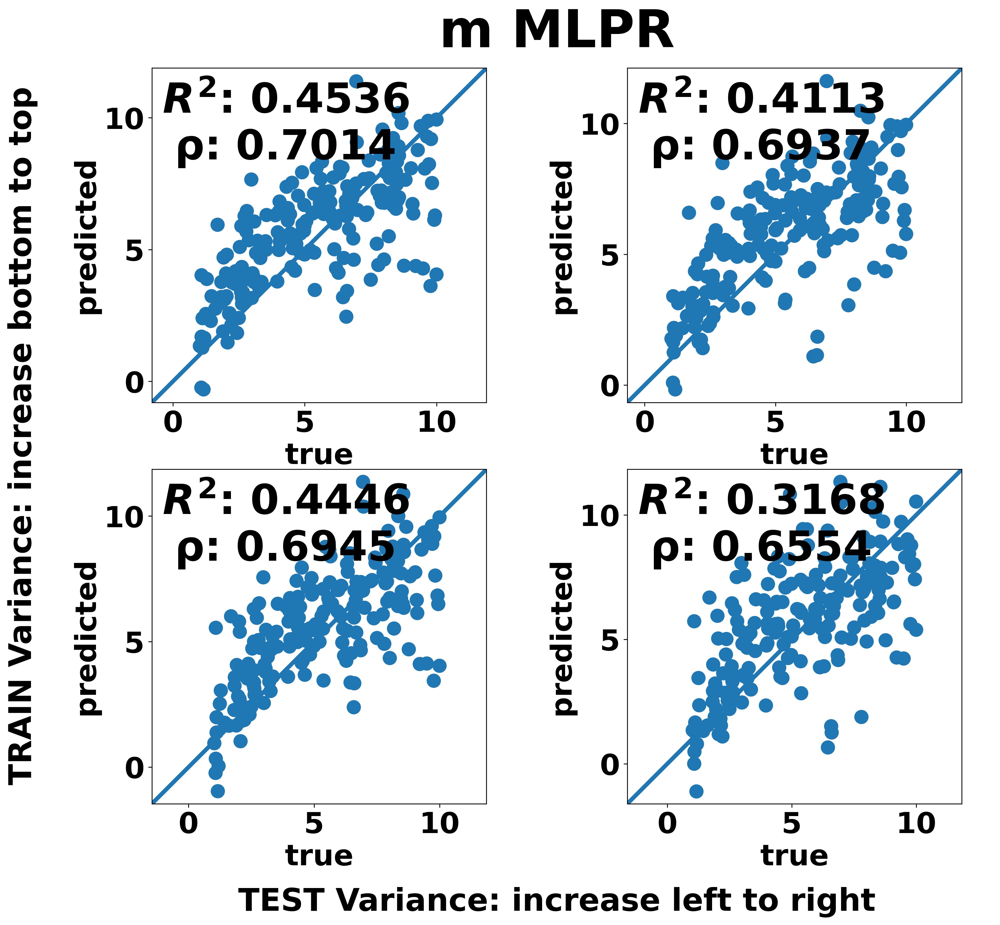

In [22]:
# Plot 2x2 training & testing var, no color
list_test_dict_clipped = [list_test_dict[0], list_test_dict[2]]
# list_rfr_clipped = [list_rfr[2], list_rfr[0]]
list_mlpr_clipped = [list_mlpr[2], list_mlpr[0]]

# Create 4 figures, one for each param
fig1=plt.figure(1, figsize=(15,13), dpi=300)
# plt.gca().set_title(r'$ν_1$ RFR', fontsize=50 , fontweight='bold', pad=20)
plt.gca().set_title(r'$ν_1$ MLPR', fontsize=50 , fontweight='bold', pad=20)

fig2=plt.figure(2, figsize=(15,13), dpi=300)
# plt.gca().set_title(r'$ν_2$ RFR', fontsize=50 , fontweight='bold', pad=20)
plt.gca().set_title(r'$ν_2$ MLPR', fontsize=50 , fontweight='bold', pad=20)

fig3=plt.figure(3, figsize=(15,13), dpi=300)
# plt.gca().set_title("T RFR", fontsize=50 , fontweight='bold', pad=20)
plt.gca().set_title("T MLPR", fontsize=50 , fontweight='bold', pad=20)

fig4=plt.figure(4, figsize=(15,13), dpi=300)
# plt.gca().set_title("m RFR", fontsize=50 , fontweight='bold', pad=20)
plt.gca().set_title("m MLPR", fontsize=50 , fontweight='bold', pad=20)

for i in range(1,5,1):
    plt.figure(i)
    ax = plt.gca()
    ax.set_xlabel("TEST Variance: increase left to right", 
                    fontsize=30 , fontweight='bold', labelpad=80)
    ax.set_ylabel("TRAIN Variance: increase bottom to top", 
                    fontsize=30 , fontweight='bold', labelpad=80)
    for key, spine in ax.spines.items():
        spine.set_visible(False)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.xticks([])
    plt.yticks([])
    plt.rcParams.update({'font.size': 28})
    plt.rcParams.update({'font.weight': 'bold'})

# testing, and plotting
count_pos = 1
# for rfr in list_rfr_clipped:# flip the order of trained rfr for plotting
for mlpr in list_mlpr_clipped:
    for test_dict in list_test_dict_clipped:
        # y_true, y_pred = ml_models.rfr_test(rfr, test_dict)
        y_true, y_pred = ml_models.mlpr_test(mlpr, test_dict)
        # sort test results by param for plotting
        param_true, param_pred = data_manip.sort_by_param(y_true, y_pred)
        # calculate r2 and rho scores by param
        r2_by_param = ml_models.r2(y_true, y_pred)[1]
        rho_by_param = stats.spearmanr(y_true, y_pred)
        # PLOT MULTIPLE SUBPLOT
        plt.figure(1)
        fig1.add_subplot(2, 2, count_pos)
        log_nu1_true = [10**param_true for param_true in param_true[0]]
        log_nu1_pred =  [10**param_pred for param_pred in param_pred[0]]
        plot_by_param_2x2(log_nu1_true, log_nu1_pred, 
                r2_by_param[0],rho=rho_by_param[0][0][4])

        plt.figure(2)
        fig2.add_subplot(2, 2, count_pos)
        log_nu2_true = [10**param_true for param_true in param_true[1]]
        log_nu2_pred =  [10**param_pred for param_pred in param_pred[1]]
        plot_by_param_2x2(log_nu2_true, log_nu2_pred, 
                r2_by_param[1], rho=rho_by_param[0][1][5])

        plt.figure(3)
        fig3.add_subplot(2, 2, count_pos)
        plot_by_param_2x2(param_true[2], param_pred[2], 
                r2_by_param[2],rho=rho_by_param[0][2][6])

        plt.figure(4)
        fig4.add_subplot(2, 2, count_pos)
        plot_by_param_2x2(param_true[3], param_pred[3], 
                r2_by_param[3], rho=rho_by_param[0][3][7])
        count_pos += 1

fig1.show()
fig2.show()
fig3.show()
fig4.show()

In [9]:
# fig1.savefig('results/RFR/nu1_old_2x2.png', bbox_inches='tight')
# fig2.savefig('results/RFR/nu2_old_2x2.png', bbox_inches='tight')
# fig3.savefig('results/RFR/T_old_2x2.png', bbox_inches='tight')
# fig4.savefig('results/RFR/m_old_2x2.png', bbox_inches='tight')

In [16]:
# fig1.savefig('results/RFR/nu1_2x2.png', bbox_inches='tight')
# fig2.savefig('results/RFR/nu2_2x2.png', bbox_inches='tight')
# fig3.savefig('results/RFR/T_2x2.png', bbox_inches='tight')
# fig4.savefig('results/RFR/m_2x2.png', bbox_inches='tight')

In [23]:
fig1.savefig('results/MLPR/nu1_2x2.png', bbox_inches='tight')
fig2.savefig('results/MLPR/nu2_2x2.png', bbox_inches='tight')
fig3.savefig('results/MLPR/T_2x2.png', bbox_inches='tight')
fig4.savefig('results/MLPR/m_2x2.png', bbox_inches='tight')